In [ ]:
# !unzip '/content/drive/MyDrive/Dog Vision/dog-breed-identification.zip' -d 'drive/My Drive/Dog Vision'

# Multi-Class Dog Breed Classification

Multi-Class image classifier (Machine Learning Model) using Tensorflow 2.0 and Tensorflow Hub

## 1. Problem
* Identify dog breed based on its picture.

## 2. Data
* The data is from kaggle dog-breed-identification competion https://www.kaggle.com/c/dog-breed-identification.

## 3. Evaluation
* A file with prediction probabilities for each dog for each test image.

## 4. Features
* ** Info about the data: **
  * images (unstructured data). Use deeplearning/transfer Learning.
  * 120 breeds of dogs (120 classes)
  * 10k plus images in the training set. (with labels)
  * 10k plus images in the test set. (without labels)

## Getting the workspace ready

* Import TensorFlow 2.x
* Import TensorFlow Hub
* Use GPU

In [20]:
# import the tools
import tensorflow as tf
import tensorflow_hub as hub
print(f'tensorflow version: {tf.__version__}')
print(f'tensorflow hub version: {hub.__version__}')

# check for GPU
print('GPU:', 'availble' if tf.config.list_physical_devices('GPU') else 'not available')

tensorflow version: 2.7.0
tensorflow hub version: 0.12.0
GPU: availble


## Getting the data ready

### Turn the images into tensors (numerical representation)


In [2]:
# check the labels of the data
import pandas as pd
labels_csv = pd.read_csv('drive/My Drive/Dog Vision/labels.csv')

print(labels_csv.describe())
labels_csv.head()

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     06cceae049531cdb98fe67d912aa58a8  scottish_deerhound
freq                                   1                 126


,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


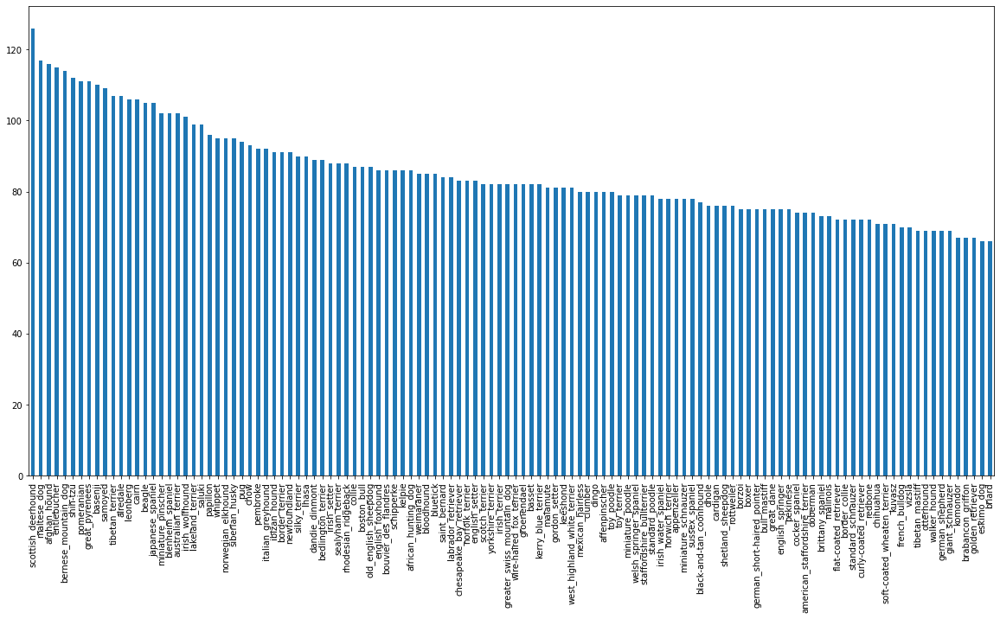

In [ ]:
# how may images are there each breed?
labels_csv['breed'].value_counts().plot(kind='bar', figsize=(20, 10))

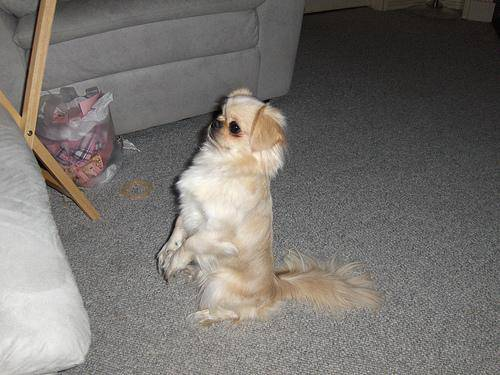

In [ ]:
# viewing an image
from IPython.display import Image

Image('drive/My Drive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg')

## Getting image and their labels

* get list of all the image file pathnames

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [3]:
filenames = [f'drive/My Drive/Dog Vision/train/{fname}.jpg' for fname in labels_csv['id']]
len(filenames)

10222

In [4]:
# check to see if the filenames from labels csv matches the actual data
import os

if len(os.listdir('drive/My Drive/Dog Vision/train')) == len(filenames):
   print('The label lenght match the actual data')
else:
   print('The label lenght did not match the actual data')


The label lenght match the actual data


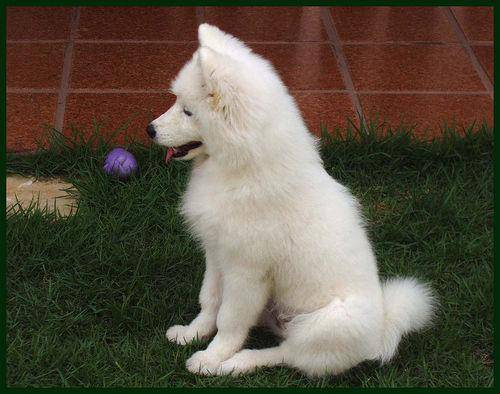

In [ ]:
#
Image(filenames[9999])

In [ ]:
labels_csv['breed'][9999]

'samoyed'

## Prepare the labels

In [5]:
import numpy as np
labels = labels_csv['breed']
labels = np.array(labels)



In [6]:
# check if label number is the same with the filenames
if len(labels) == len(filenames):
  print('labels and filenames match/no missing data')
else:
  print('labels and filename did not match, there maybe some missing data')

labels and filenames match/no missing data


In [7]:
# convert labels into numbers
unique_labels =  np.unique(labels)
len(unique_labels)

120

In [8]:
# turn labels into array of booleans
boolean_labels = [label == unique_labels for label in labels]
len(boolean_labels)

10222

## Create a validation set because it is not provided by kaggle

In [15]:
# setup X and y variable
X = filenames
y = boolean_labels

In [17]:
# experiment with 1000 images and increase a needed
NUM_IMAGES = 1000 #@param {type:'slider', min:1000, max:10000, step:1000}

In [18]:
# split the data into train and validation set
from sklearn.model_selection import train_test_split

# split them into train and validation sets of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES], y[:NUM_IMAGES], test_size=0.2, random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
X_train[:5], y_train[:2]

(['drive/My Drive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/My Drive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/My Drive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/My Drive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/My Drive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, Fa

## Preprocess the images (turn images into tensors)

In [9]:
# function to preprocess images
IMG_SIZE = 224

def process_img(image_path, img_size=IMG_SIZE):
  """
  Takes an image filepath and turns the image into a tensor
  """
  # Read the image file from path
  image = tf.io.read_file(image_path)

  # Turn the jpeg image into a numerical tensor with 3 color channels (RGB)
  image = tf.image.decode_jpeg(image, channels=3)

  # Convert the color channel values from 0-255 to 0-1 values (normalization)
  image = tf.image.convert_image_dtype(image, tf.float32)

  # Resize the image to the desire value (224, 224)
  image = tf.image.resize(image, size=(IMG_SIZE, IMG_SIZE))

  # Return the image
  return image


## Turn the data into batches

* We batch(32) the data so that they fit in the memory.
* In order to use TensorFlow effectively, we need the data in the form of tensor tuples. ex: (image, label)

In [10]:
# create a function that will return a tuple of tensors
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and return a tuple of (image, label)
  """
  image = process_img(image_path)
  return image, label

In [ ]:
# demo of the function above
(process_img(X[42], tf.constant(y[42]))) # tf.constant turn label into a tensor


<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[0.3264178 , 0.5222886 , 0.3232816 ],
        [0.2537167 , 0.44366494, 0.24117757],
        [0.25699762, 0.4467087 , 0.23893751],
        ...,
        [0.29325107, 0.5189916 , 0.3215547 ],
        [0.29721776, 0.52466875, 0.33030328],
        [0.2948505 , 0.5223015 , 0.33406618]],

       [[0.25903144, 0.4537807 , 0.27294815],
        [0.24375686, 0.4407019 , 0.2554778 ],
        [0.2838985 , 0.47213382, 0.28298813],
        ...,
        [0.2785345 , 0.5027992 , 0.31004712],
        [0.28428748, 0.5108719 , 0.32523635],
        [0.28821915, 0.5148036 , 0.32916805]],

       [[0.20941195, 0.40692952, 0.25792548],
        [0.24045378, 0.43900946, 0.2868911 ],
        [0.29001117, 0.47937486, 0.32247734],
        ...,
        [0.26074055, 0.48414773, 0.30125174],
        [0.27101526, 0.49454468, 0.32096273],
        [0.27939945, 0.5029289 , 0.32934693]],

       ...,

       [[0.00634795, 0.03442048, 0.0258106 ],
        [0.01

## Create a function to turn all of the data (X, y) into batches

In [11]:
# define a batchsize, 32 is a good start
BATCH_SIZE = 32

# function to turn all of the data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, val_data=False, test_data=False):
  '''
  Creates batches of data out of image(X) and label(y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data a input (no labels)
  '''
  # if the data is a test dataset(no labels)
  if test_data:
    print('Creating test data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths no labels
    data_batch = data.map(process_img).batch(BATCH_SIZE) # the process_image function created earlier will be applied to the data, then it will be batched.
    return data_batch
  
  # if the data is a validation dataset (no need to shuffle)
  elif val_data:
    print('Creating validation data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y)  # labels
                                               ))
    # use get_image_label because the label is needed(also has process_image in the get_image_label function)
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  # if the data is a training dataset (need to shuffle)
  else:
    print('Creating training data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                                tf.constant(y)))
    
    # shuffle pathnames and labels before mapping (faster than shuffling images)
    data = data.shuffle(buffer_size=len(X)) # buffer_size=len(X) = shuffle all
    data = data.map(get_image_label)

    # turn it into batches
    data_batch = data.batch(BATCH_SIZE)
    return data_batch


In [21]:
## Create training and validation data batches
train_data = create_data_batches(X_train, y_train) 
val_data = create_data_batches(X_val, y_val, val_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# check attribs of the batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualzing the data batches

In [22]:
import matplotlib.pyplot as plt

# function for viewing images in a data batch
def show_25(images, labels):
  '''
  Display a plot of 25 images and their labels from a data batch 
  '''
  plt.figure(figsize=(15,10))

  for i in range(25):
    ax = plt.subplot(5, 5, i+1) # rows, col, index
    # display image
    plt.imshow(images[i])
    # add image label as title
    plt.title(unique_labels[labels[i].argmax()])
    # grid line off
    plt.axis('off')

In [ ]:
unique_labels[y[19].argmax()]

'boxer'

In [ ]:
train_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [ ]:
# unbatch the train_data/separate
train_images, train_labels = next(train_data.as_numpy_iterator())
# train_images, train_labels

In [ ]:
len(train_images), len(train_labels)

(32, 32)

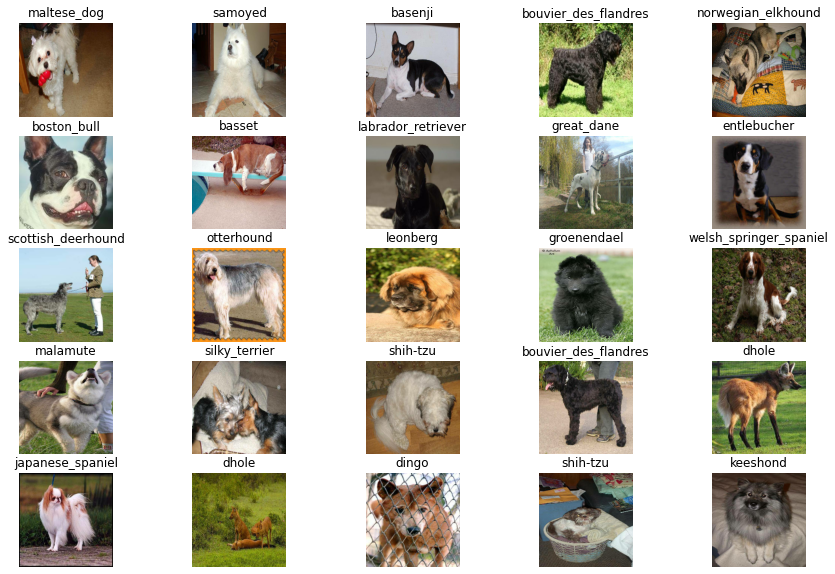

In [ ]:
show_25(train_images, train_labels)

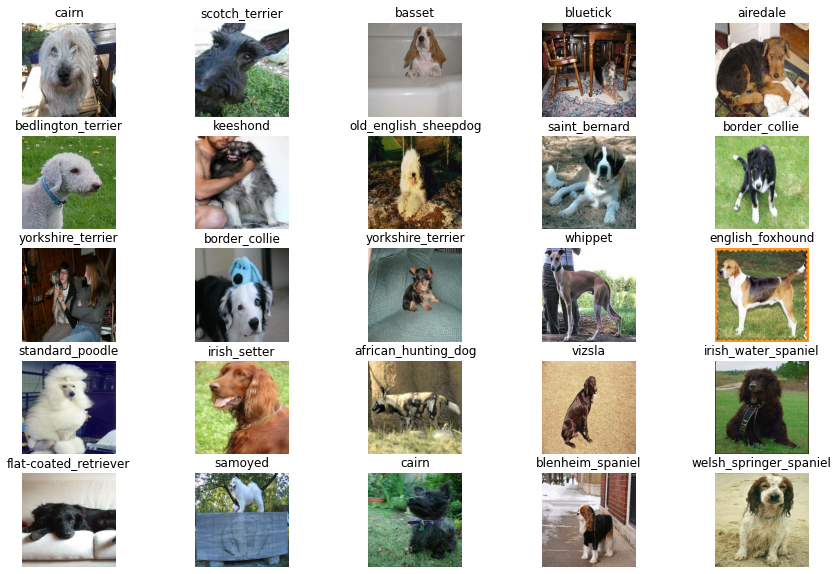

In [23]:
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25(val_images, val_labels)

## Building a model
### Define:
* input shape(image shape in form of tensors) to the model.
* output shape(image labels, in form of tensors) of the model.
* the URL of the model used from tensorflow hub. https://tfhub.dev/s?module-type=image-classification&network-architecture=mobilenet-v2

In [25]:
# setup input shape for the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, color channels

# setup output shape
OUTPUT_SHAPE = len(unique_labels)

# setup model url from tensorflow hub
MODEL_URL = 'https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5'

## Keras deep learning model

### Create a function that:
* Takes the input shape, output shape and the model chosen as parameters.
* Defines the layers in a Keras model in sequential fashion (linear step-by-step process).
* Compiles the model (tells how it should be evaluated and improved)
* Builds the model (given the model the input shape it will be getting)
* Returns the model.


https://www.tensorflow.org/guide/keras/sequential_model

In [26]:
# create a function that creates a keras model 
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print('Building model with:', model_url)

  # setup model layers
  model = tf.keras.Sequential([
   hub.KerasLayer(MODEL_URL), # layer 1 (input layer)
   tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                         activation='softmax') # layer 2 (output layer), binary classification use sigmoid and softmax for multiclass classification
  ])

  # compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(), # loss is how well the model is guessing (higher loss = worse prediction), Use CategoricalCrossentropy for multiclass and BinaryCrossentropy for binary classification
      optimizer=tf.keras.optimizers.Adam(), # optimizer to lower the loss
      metrics=['accuracy'] # evaluating
  )

  # build the model
  model.build(input_shape) # shape(image size) the mobilenetv2 is trained on

  return model


In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Create callbacks 
### helper functions a model can use during training to do things like save progress, check progress or stop training early (if the model isn't improving)

#### 2 callbacks:
* 1 for tensorboard which tracks models progress.
* 1 for early stopping to prevent the model from training too long.

#### To setup a tensorboard callback:
* Load the tensorboard notebook extension.
* Create a tensorboard callback for saving logs to a directory and pass it to the model's `fit()` function.
* Visualize the model's training logs using `%tensorboard` magic function (after model training)

In [27]:
# load tensorboard notebook extension
%load_ext tensorboard

In [28]:
import datetime

# create a function to build a tensorboard callback
def create_tensorboard_callback():
  # create a log directory for storing tensorboard logs
  logdir = os.path.join('drive/My Drive/Dog Vision/logs', datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))

  return tf.keras.callbacks.TensorBoard(logdir)

#### Early stopping callback
* helps stop the model from overfitting by stopping the training if a certain evaluation metric stops improving.

In [29]:
# create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=3)

## Training a model (on a subset of data to make sure everyting is working)

In [ ]:
# epochs is how many times the model will go through the training dataset 
NUM_EPOCHS = 100 #@param {type:'slider', min:10, max:100, step:10}

In [ ]:
# check again to see if gpu is used
print('GPU availabe' if tf.config.list_physical_devices('GPU') else 'GPU unavailable')

GPU availabe


## Function to train model
* create a model using `create_model()` (a function created previously)
* setup tensorboard callback using `create_tensorboard_callback()` (a function created previously)
* call the fit function on the model passing it the training data, validation data, number of epochs to train for (`NUM_EPOCHS`) and the callbacks
* return the model

In [ ]:
# create a function to train and return a trained model
def train_model():
  '''
  Trains a given model and return that trained version of that model.
  '''
  # create a model
  model = create_model()

  # create a tensorboad session everytime a model is trained
  tensorboard = create_tensorboard_callback()

  # fit the data and passing the callbacks
  model.fit(x=train_data, epochs=NUM_EPOCHS, validation_data=val_data, validation_freq=1, callbacks=[tensorboard, early_stopping])

  # return the fitted model
  return model

In [ ]:
# fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 124s 3s/step - loss: 4.6356 - accuracy: 0.0825 - val_loss: 3.4026 - val_accuracy: 0.2650
Epoch 2/100
25/25 [==============================] - 4s 168ms/step - loss: 1.6805 - accuracy: 0.6787 - val_loss: 2.1857 - val_accuracy: 0.4950
Epoch 3/100
25/25 [==============================] - 4s 173ms/step - loss: 0.5813 - accuracy: 0.9337 - val_loss: 1.7052 - val_accuracy: 0.5850
Epoch 4/100
25/25 [==============================] - 4s 178ms/step - loss: 0.2616 - accuracy: 0.9887 - val_loss: 1.5097 - val_accuracy: 0.6300
Epoch 5/100
25/25 [==============================] - 4s 172ms/step - loss: 0.1495 - accuracy: 1.0000 - val_loss: 1.4438 - val_accuracy: 0.6450
Epoch 6/100
25/25 [==============================] - 4s 173ms/step - loss: 0.1013 - accuracy: 1.0000 - val_loss: 1.3979 - val_accuracy: 0.6550
Epoch 7/100
25/25 [==============================]

### the model is overfitting because it performs way better in the training dataset that the validation dataset.
### NOTE: overfitting to begin with is a good thing because it means that the model is learning.

## Checking the TensorBoard logs
### the tensorboard magic function will access logs directory(created earlier) and visualize its contents

In [ ]:
%tensorboard --logdir drive/My\ Drive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making a prediction and evaluating it using a trained model

In [ ]:
val_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [ ]:
# make predictions on validation data (not used in training the model)
predictions = model.predict(val_data, verbose=1) # verbose=1 shows progress
predictions

7/7 [==============================] - 1s 127ms/step


array([[9.5534639e-04, 1.1231867e-05, 4.0843566e-03, ..., 8.4538682e-04,
        2.5424264e-05, 1.0365397e-03],
       [4.9920107e-04, 1.0565210e-03, 5.9803985e-03, ..., 2.1095897e-04,
        8.5763581e-04, 4.9558341e-05],
       [2.1392625e-05, 2.5243311e-05, 6.5084270e-05, ..., 2.2493508e-05,
        4.0168384e-06, 4.5796780e-05],
       ...,
       [1.2629596e-06, 3.4733544e-05, 8.9821160e-06, ..., 7.9016422e-07,
        7.4503107e-05, 6.7572896e-06],
       [3.1748086e-03, 9.5050031e-04, 8.6062377e-05, ..., 2.9105897e-04,
        1.4506592e-04, 7.2819898e-03],
       [3.6753315e-04, 4.8265589e-05, 2.1792861e-04, ..., 4.6743199e-04,
        1.4858485e-04, 6.7981086e-06]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(y_val), len(unique_labels) 

(200, 120)

In [ ]:
np.sum(predictions[0])

1.0

In [ ]:
unique_labels[predictions[0].argmax()]

'border_terrier'

In [ ]:
index = 100
print(f'Max value (probability of prediction) : {np.max(predictions[index])}')
print(f'Sum : {predictions[index].sum()}')
print(f'Sum : {np.sum(predictions[index])}')
print(f'Max index : {np.argmax(predictions[index])}')
print(f'Predicted breed : {unique_labels[predictions[index].argmax()]}')

Max value (probability of prediction) : 0.6984547972679138
Sum : 0.9999998807907104
Sum : 0.9999998807907104
Max index : 14
Predicted breed : bloodhound


In [ ]:
# prediction probabilities is aka confidence interval

In [30]:
# turn prediction probability in their respective label for easier understanding
def get_pred_label(prediction_probabilities):
  '''
  Turns an array of probabilities into a label.
  '''
  return unique_labels[np.argmax(prediction_probabilities)]

# get_pred_label(predictions[1])

## Unbatch the validation dataset to make predictions on the validation images and compare those predictions to the validation labels(true labels)

In [ ]:
# create a function to unbatch a dataset
images_unbatched = []
labels_unbatched = []

for image, label in val_data.unbatch().as_numpy_iterator():
  images_unbatched.append(image)
  labels_unbatched.append(label)

images_unbatched[0], labels_unbatched[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(labels_unbatched[5]), get_pred_label(predictions[5])

('bedlington_terrier', 'bedlington_terrier')

In [31]:
# create a function to unbatch a dataset
def unbatchify(dataset):
  '''
  Takes a batched dataset of (image, label) and returns separate arrays 
  of images and labels
  '''
  images = []
  labels = []

  # loop through unbatched data
  for image, label in dataset.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_labels[label.argmax()])

  return images, labels

In [ ]:

val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(predictions[5]), get_pred_label(val_labels[5]) # wrong prediction

('bedlington_terrier', 'affenpinscher')

## Create a function to make the results more visual
* Takes an array of prediction probabilities, an array of truth labels and an array of images and integer.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the true label and the 
target image in a single plot.

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n):
  '''
  View the prediction, ground truth and image for sample n
  '''
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # get prediction label
  pred_label = get_pred_label(pred_prob)

  # plot image
  plt.imshow(image)
  plt.xticks([]) # just turning it off
  plt.yticks([])

  # change color of the title if the prediction is right/wrong
  if pred_label == true_label:
    color = 'green'
  else:
    color = 'red'


  # change plot title to be the predicted label, probabilit of prediction and true label
  plt.title(f'{pred_label} {np.max(pred_prob)*100:2.0f}% {true_label}', color=color)
  

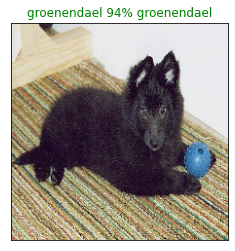

In [ ]:
plot_pred(prediction_probabilities=predictions, labels=val_labels, images=val_images, n=77)

## Create a function to view top 10 prediction
* Takes an input of prediction probabilities array and a groud truth array and an interger.
* Find the prediction using `get_pred_label()`.
* Find the top 10: prediction probabilies indexes, prediction 
probabilities values and the prediction labels
* Plot the top 10 prediction probability values and labels. Color the true label green.


In [ ]:
def plot_pred_confidence(prediction_probabilities, labels, n):
  '''
  Plots the top 10 prediction confidences along with the truth label for sample n.
  '''
  pred_prob, true_label = prediction_probabilities[n], labels[n]
  
  # get the predicted label
  pred_label = get_pred_label(pred_prob)

  # find the top 10 confidence indexes
  top_ten_pred_indexes = pred_prob.argsort()[-10:][::-1] # [::-1] (reverse fpr descending)

  # find the top 10 confidence values
  top_ten_pred_values = pred_prob[top_ten_pred_indexes]

  # find the top 10 confidence labels
  top_ten_pred_labels = unique_labels[top_ten_pred_indexes]

  # setup a plot
  top_plot = plt.bar(np.arange(len(top_ten_pred_labels)), # 10 bars on the plot
                     top_ten_pred_values,
                     color='grey')
  plt.xticks(np.arange(len(top_ten_pred_labels)),# 10 ticks
             labels=top_ten_pred_labels,
             rotation='vertical') 
  
  # change the color of the true labels
  if np.isin(true_label, top_ten_pred_labels):
    top_plot[np.argmax(top_ten_pred_labels == true_label)].set_color('green')
  else:
    pass

In [ ]:
unique_labels[predictions[0].argsort()[-10:][::-1]]

array(['border_terrier', 'cairn', 'tibetan_terrier', 'lhasa',
       'silky_terrier', 'irish_wolfhound', 'scottish_deerhound',
       'soft-coated_wheaten_terrier', 'komondor', 'shih-tzu'],
      dtype=object)

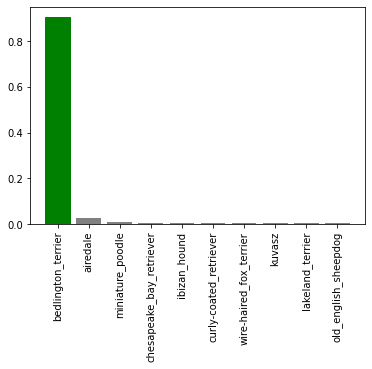

In [ ]:
plot_pred_confidence(prediction_probabilities=predictions, labels=val_labels, n=5)

In [ ]:
unique_labels[predictions[0].argsort()[-10:][::-1]]

array(['border_terrier', 'cairn', 'tibetan_terrier', 'lhasa',
       'silky_terrier', 'irish_wolfhound', 'scottish_deerhound',
       'soft-coated_wheaten_terrier', 'komondor', 'shih-tzu'],
      dtype=object)

In [ ]:
# test
# index = 5
# np.argmax(unique_labels[predictions[index].argsort()[-10:][::-1]] == val_labels[index])

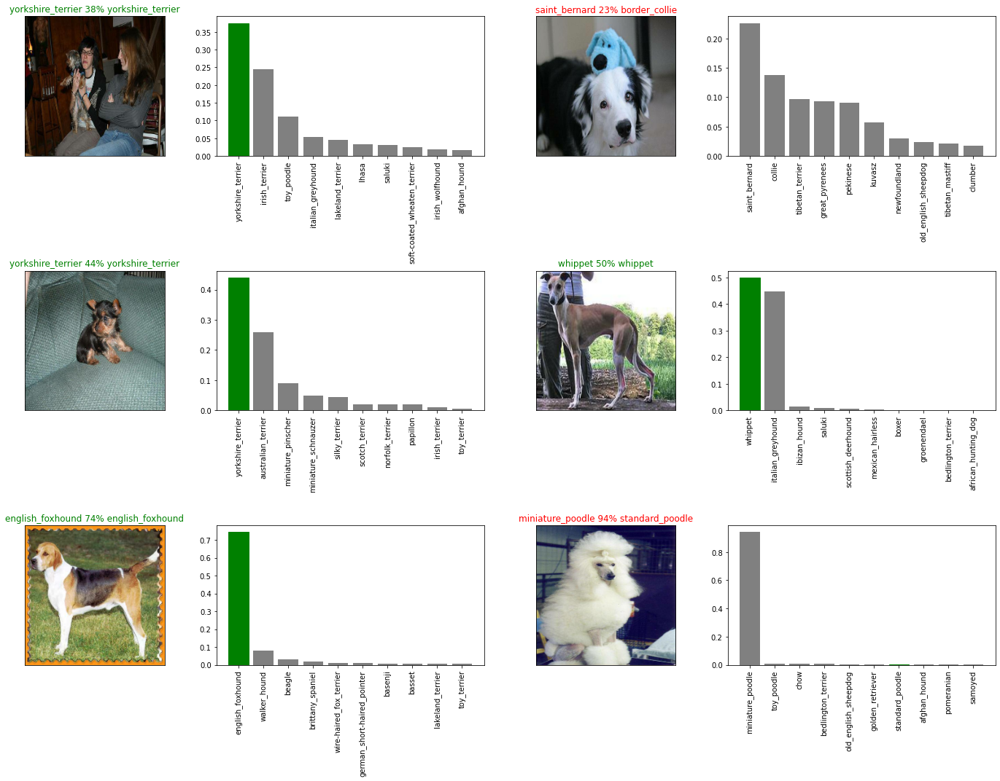

In [ ]:
# Check multiple predictions and their different values
i_multiplier = 10 # ex: 10 will show 10 to 16th images
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols

plt.figure(figsize=(10*num_cols,5*num_rows))

for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1, label='True Photo')
  plot_pred(prediction_probabilities=predictions, 
            labels=val_labels, 
            images=val_images, 
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2, label='Top 10 Guesses')
  plot_pred_confidence(prediction_probabilities=predictions, 
                       labels=val_labels, 
                       n=i+i_multiplier)
  plt.tight_layout(h_pad=1.0)
plt.show()

## Challeng: Create a confusion matrix

## Saving and realoding a trained model

In [32]:
# create a function that will save a model
def save_model(model, suffix=None):
  '''
  Saves a given model in a model directory and appends a suffix(string)
  '''
  # create model directory pathname with current time
  modeldir = os.path.join('drive/My Drive/Dog Vision/models', datetime.datetime.now().strftime('%Y%m%d-%H%M%s'))
  model_path = f'{modeldir}-{suffix}.h5' # h5 is the save format of the model
  print(f'Saving model to: {model_path}...')
  model.save(model_path)

  return model_path

In [33]:
# create a function that will load a trained model
def load_model(model_path):
  '''
  Loads a saved model from the specified path
  '''
  print(f'Loading the model from {model_path}...')
  model = tf.keras.models.load_model(model_path, custom_objects={'KerasLayer':hub.KerasLayer}) # custom_objects because we used special layers

  return model


In [ ]:
# test save function
save_model(model, suffix='1000-images-adam')

Saving model to: drive/My Drive/Dog Vision/models/20220122-14511642863071-1000-images-adam.h5...


'drive/My Drive/Dog Vision/models/20220122-14511642863071-1000-images-adam.h5'

In [ ]:
# test load function
model_1000_images = load_model('drive/My Drive/Dog Vision/models/20220122-14511642863071-1000-images-adam.h5')

Loading the model from drive/My Drive/Dog Vision/models/20220122-14511642863071-1000-images-adam.h5...


In [ ]:
# evaluate the presaved model
model.evaluate(val_data)


7/7 [==============================] - 1s 84ms/step - loss: 1.2611 - accuracy: 0.6850


[1.2610907554626465, 0.6850000023841858]

In [ ]:
# evalueate the loaded model
model_1000_images.evaluate(val_data)

7/7 [==============================] - 1s 86ms/step - loss: 1.2611 - accuracy: 0.6850


[1.2610907554626465, 0.6850000023841858]

# Train the model on full dataset

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
len(X_train), len(y_train)

(800, 800)

In [ ]:
full_data = create_data_batches(X, y)
full_data

Creating training data batches...


<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

## create a model that will be trained on the full dataset

In [ ]:
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
# create full model callbacks
full_model_tensorboard = create_tensorboard_callback() # no validation set when training on all data so no monitoring of validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor='accuracy', patience=3)

## Running the code below will start the training process, this will take a while

In [ ]:
print('GPU:', 'availble' if tf.config.list_physical_devices('GPU') else 'not available')

GPU: availble


In [ ]:
# full_model.fit(full_data,
#                epochs=NUM_EPOCHS,
#                callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 41s 117ms/step - loss: 1.3468 - accuracy: 0.6696
Epoch 2/100
320/320 [==============================] - 38s 118ms/step - loss: 0.3997 - accuracy: 0.8816
Epoch 3/100
320/320 [==============================] - 39s 121ms/step - loss: 0.2378 - accuracy: 0.9363
Epoch 4/100
320/320 [==============================] - 37s 117ms/step - loss: 0.1527 - accuracy: 0.9635
Epoch 5/100
320/320 [==============================] - 38s 119ms/step - loss: 0.1076 - accuracy: 0.9788
Epoch 6/100
320/320 [==============================] - 40s 124ms/step - loss: 0.0781 - accuracy: 0.9868
Epoch 7/100
320/320 [==============================] - 40s 126ms/step - loss: 0.0576 - accuracy: 0.9919
Epoch 8/100
320/320 [==============================] - 45s 141ms/step - loss: 0.0467 - accuracy: 0.9931
Epoch 9/100
320/320 [==============================] - 46s 143ms/step - loss: 0.0379 - accuracy: 0.9953
Epoch 10/100
320/320 [==============================] - 41s 128m

In [ ]:
# load model
save_model(full_model, suffix='full-image-set-mobilenetv2-Adam')

Saving model to: drive/My Drive/Dog Vision/models/20220123-06291642919344-full-image-set-mobilenetv2-Adam.h5...


'drive/My Drive/Dog Vision/models/20220123-06291642919344-full-image-set-mobilenetv2-Adam.h5'

In [34]:
# load model
loaded_full_model = load_model('drive/My Drive/Dog Vision/models/20220123-06291642919344-full-image-set-mobilenetv2-Adam.h5')

Loading the model from drive/My Drive/Dog Vision/models/20220123-06291642919344-full-image-set-mobilenetv2-Adam.h5...


In [ ]:
len(X)

10222

## Making predictions on the test data set
* The test dataset should be transformed like the train dataset.
* Use the `create_data_batches()` function that is created earlier.

### To make predictions:
1. Get image filenames.
2. Convert filenames into test data batches using `create_data_batches()` function and set the `test_data` parameter to `True` (because the test_data has no labels).
3. Make a predictions array by passing the test batches to the `predict()` method called on the model. 

In [36]:
# load test image filenames
test_path = 'drive/My Drive/Dog Vision/test/'
test_filenames = [test_path + fname for fname in os.listdir(test_path)] # list comprehension to list filenames concatinated with test_path
test_filenames[:10]

['drive/My Drive/Dog Vision/test/e1c6c50bbaee219e7faf29e9c1c343ca.jpg',
 'drive/My Drive/Dog Vision/test/e021107c3f07749e5f5b389e57e21ded.jpg',
 'drive/My Drive/Dog Vision/test/dfac7db18136057f5d1730c0055f875c.jpg',
 'drive/My Drive/Dog Vision/test/e5ded7a736b3336729463af8d74a09c9.jpg',
 'drive/My Drive/Dog Vision/test/e5fc0207e1db00fa778b00832f622b10.jpg',
 'drive/My Drive/Dog Vision/test/e6e8ae7dc0e71c6ae868fd3371fde010.jpg',
 'drive/My Drive/Dog Vision/test/e52a4321a8cb0dd3bcc8f4a68b75eee7.jpg',
 'drive/My Drive/Dog Vision/test/e699b20911a55abda3558c5bcd37443d.jpg',
 'drive/My Drive/Dog Vision/test/dccf2e91f79396055e7ff83f1f207fbc.jpg',
 'drive/My Drive/Dog Vision/test/e519e383a6efec0abd285beda04aeac9.jpg']

In [ ]:
len(test_filenames)

10357

In [37]:
# create test data batches using create_data_batches function
test_dataset = create_data_batches(test_filenames, test_data=True) # test_data=True will create test data batches

Creating test data batches...


In [ ]:
test_dataset

<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

## Calling `predict()` on full model and passing the full dataset will take long to finish

In [ ]:
# make predictions array on test_data using the loaded model
test_predictions = loaded_full_model.predict(test_dataset, verbose=1)
test_predictions

324/324 [==============================] - 54s 165ms/step


array([[9.92693305e-01, 1.18343856e-07, 2.28213057e-08, ...,
        1.80985435e-12, 1.32371239e-10, 9.27037181e-05],
       [2.03386596e-09, 1.07533808e-07, 6.82046402e-06, ...,
        1.83519533e-10, 3.40633477e-07, 1.75421774e-10],
       [1.01101159e-11, 1.35485941e-04, 4.33445752e-10, ...,
        1.08856810e-07, 1.49794066e-09, 1.79327209e-09],
       ...,
       [9.97807920e-01, 6.21859726e-07, 1.59028019e-07, ...,
        4.77580508e-09, 1.24915596e-06, 3.53653036e-06],
       [4.87828222e-09, 7.27844522e-08, 1.59226486e-11, ...,
        1.99504441e-07, 1.60932746e-06, 1.76892434e-09],
       [9.99999642e-01, 7.93986513e-13, 2.86812268e-14, ...,
        2.31044499e-15, 1.07164377e-09, 1.43576928e-09]], dtype=float32)

In [ ]:
test_predictions[:10]

array([[9.92693305e-01, 1.18343856e-07, 2.28213057e-08, ...,
        1.80985435e-12, 1.32371239e-10, 9.27037181e-05],
       [2.03386596e-09, 1.07533808e-07, 6.82046402e-06, ...,
        1.83519533e-10, 3.40633477e-07, 1.75421774e-10],
       [1.01101159e-11, 1.35485941e-04, 4.33445752e-10, ...,
        1.08856810e-07, 1.49794066e-09, 1.79327209e-09],
       ...,
       [3.50309531e-10, 4.71646666e-10, 1.02389264e-09, ...,
        1.73924860e-07, 6.52027040e-07, 4.49252013e-08],
       [9.34937461e-08, 9.40713688e-11, 8.02135441e-12, ...,
        1.73062098e-09, 5.75748118e-07, 3.52468049e-07],
       [8.38821288e-05, 1.85633269e-07, 5.31672706e-10, ...,
        6.30230716e-07, 1.46447660e-10, 8.15108606e-11]], dtype=float32)

In [ ]:

np.savetxt('drive/My Drive/Dog Vision/preds_array.csv', test_predictions, delimiter=',')

In [ ]:
test_predictions_csv = np.loadtxt('drive/My Drive/Dog Vision/preds_array.csv', delimiter=',')

In [ ]:
test_predictions_csv.shape

(10357, 120)

## Preparing test dataset predictions for kaggle evaluation 
https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

* Create a panda dataframe with column for id and each dog breed.
* Add data to the id column by extracting the test image's from their file paths.
* Add data (prediction probabilities) to each of the dog breed columns.
* Export the dataframe as csv to submit it to kaggle. 

In [ ]:
# ['id']+list(unique_labels) # columns to use (id and all the unique breeds)

In [ ]:
preds_df = pd.DataFrame(columns=['id'] + list(unique_labels))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# demo of the code below
os.path.splitext(test_filenames[0])

('drive/My Drive/Dog Vision/test/e1c6c50bbaee219e7faf29e9c1c343ca', '.jpg')

In [ ]:
# code below will get the filename from test_path (will remove that path and the .jpg)
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df['id'] = test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e1c6c50bbaee219e7faf29e9c1c343ca,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e021107c3f07749e5f5b389e57e21ded,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,dfac7db18136057f5d1730c0055f875c,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e5ded7a736b3336729463af8d74a09c9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e5fc0207e1db00fa778b00832f622b10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# add the prediction probabilities to the dataframe
preds_df[list(unique_labels)] = test_predictions_csv

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e1c6c50bbaee219e7faf29e9c1c343ca,0.992693,1.18344e-07,2.28213e-08,1.97297e-11,3.8408e-13,9.84748e-13,9.99115e-09,3.42653e-12,5.06311e-11,6.2347e-13,1.58597e-10,0.0016198,1.07194e-15,2.36096e-07,1.2402e-13,1.85812e-10,1.82333e-05,1.80487e-07,1.49367e-10,2.14228e-10,9.48075e-05,6.28117e-12,2.76805e-07,4.65693e-06,1.83441e-12,5.01967e-08,2.7328e-07,7.87839e-11,4.07449e-14,5.06896e-09,1.06945e-07,1.9313e-11,2.22233e-06,3.80395e-12,6.31939e-12,3.92038e-09,1.44276e-14,2.40599e-12,4.37266e-14,...,6.93235e-12,2.37288e-06,7.6251e-09,1.18746e-12,3.06029e-08,0.00455655,1.18839e-13,9.51761e-08,1.29652e-08,1.19918e-09,3.98962e-09,2.1447e-12,5.22103e-11,1.67566e-10,2.13055e-07,1.7896e-05,1.73192e-06,1.59172e-10,0.000580333,2.92141e-10,0.000283412,2.30327e-13,7.10426e-08,8.53135e-08,8.74369e-07,1.04053e-10,3.5492e-08,2.6015e-10,2.90474e-08,2.61386e-06,5.16493e-07,8.8572e-12,5.00646e-09,7.87573e-12,1.48189e-10,8.04139e-13,5.22815e-11,1.80985e-12,1.32371e-10,9.27037e-05
1,e021107c3f07749e5f5b389e57e21ded,2.03387e-09,1.07534e-07,6.82046e-06,3.51342e-10,9.43852e-09,1.48071e-06,2.64018e-06,5.42947e-06,3.56227e-10,6.71767e-10,6.82293e-08,1.36936e-09,1.63134e-06,1.30897e-08,5.15183e-07,1.79815e-09,6.03189e-09,1.24936e-08,1.38429e-09,7.18481e-11,2.97045e-10,1.11669e-10,1.47317e-08,2.14852e-08,7.51102e-09,3.41457e-09,7.14189e-08,9.34208e-07,1.73162e-08,2.43448e-07,2.80817e-07,1.21036e-08,1.46702e-09,9.43886e-07,2.37354e-11,1.15639e-09,0.000428285,0.996948,6.50237e-09,...,6.36172e-09,0.000127095,6.63792e-10,5.89453e-10,2.35091e-07,1.00572e-08,5.04774e-05,1.42204e-09,5.37764e-09,3.11511e-06,3.96644e-07,1.07112e-09,1.52495e-10,3.46037e-07,9.69373e-08,2.84746e-07,1.10509e-06,2.43834e-10,2.56719e-10,1.04014e-08,7.253e-08,3.7926e-07,5.24945e-07,1.92955e-07,1.75506e-08,2.68827e-07,8.8006e-09,6.01303e-10,1.31826e-06,1.56648e-08,1.45329e-09,3.08778e-08,4.37453e-09,5.91651e-09,3.19793e-08,1.52006e-06,4.07986e-07,1.8352e-10,3.40633e-07,1.75422e-10
2,dfac7db18136057f5d1730c0055f875c,1.01101e-11,0.000135486,4.33446e-10,4.53807e-06,8.09597e-09,3.3022e-10,9.85393e-09,3.73351e-09,4.9744e-07,2.9871e-08,1.58367e-09,3.13013e-11,6.45433e-06,8.74247e-11,0.971663,8.86659e-07,1.19976e-09,4.18586e-07,3.99676e-10,2.14731e-09,3.52932e-07,2.05665e-06,5.47448e-07,9.62259e-08,9.23911e-11,0.00990145,3.26131e-10,2.03115e-10,2.17558e-05,1.51606e-10,2.89124e-09,5.46241e-08,1.83923e-08,4.97504e-08,1.39441e-08,2.35564e-10,2.20219e-06,0.000304396,1.12468e-07,...,3.05351e-10,1.94641e-09,9.55477e-09,2.04817e-07,5.30791e-09,9.38419e-08,4.29901e-10,9.88856e-09,1.08334e-08,3.5332e-06,0.0157515,3.31541e-05,1.65991e-07,4.59384e-09,2.18857e-10,3.84438e-09,1.23767e-11,5.01073e-09,1.04003e-08,1.07585e-07,3.19865e-09,2.91039e-08,6.32538e-09,6.82295e-07,2.10991e-06,2.12454e-06,1.15095e-08,2.82264e-07,5.40591e-08,1.29278e-07,3.33193e-10,2.51742e-09,0.000191907,5.52638e-06,8.69284e-10,4.79184e-10,2.07639e-12,1

In [ ]:
# convert to csv and submit to kaggle
preds_df.to_csv('drive/My Drive/Dog Vision/mobilenetv2_prediction_submission.csv', index=False)

## Make predictions on custom images (images must be the same format as training dataset)

In [38]:
custom_path = 'drive/My Drive/Dog Vision/dog photos/'
custom_image_paths = [custom_path+fname for fname in os.listdir(custom_path)]

In [39]:
custom_image_paths

['drive/My Drive/Dog Vision/dog photos/afh.jpg',
 'drive/My Drive/Dog Vision/dog photos/dm.jpeg',
 'drive/My Drive/Dog Vision/dog photos/eb.jpg']

In [40]:
# custom images into batch dataset
custom_dog_images = create_data_batches(X=custom_image_paths, test_data=True)
custom_dog_images

Creating test data batches...


<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

In [41]:
# predict breed using the model
custom_dog_images_preds = loaded_full_model.predict(custom_dog_images)

In [42]:
# custom_images, custom_labels = unbatchify(custom_dog_images_preds)
# custom_dog_images_preds.shape
custom_dog_images_preds_max_val = [max(item) for item in custom_dog_images_preds]
custom_dog_images_preds_max_val

[0.9999957, 0.9445284, 0.8874901]

In [43]:
# get custom pred labels
custom_dog_images_preds_labels = [get_pred_label(custom_dog_images_preds[i]) for i in range(len(custom_dog_images_preds))]
custom_dog_images_preds_labels

['afghan_hound', 'doberman', 'entlebucher']

In [ ]:
custom_image_paths

['drive/My Drive/Dog Vision/dog photos/afh.jpg',
 'drive/My Drive/Dog Vision/dog photos/dm.jpeg',
 'drive/My Drive/Dog Vision/dog photos/eb.jpg']

In [44]:
# get the custom images (make improvements on unbatchify function)
custom_dog_pics = []
for image in custom_dog_images.unbatch().as_numpy_iterator():
  custom_dog_pics.append(image)



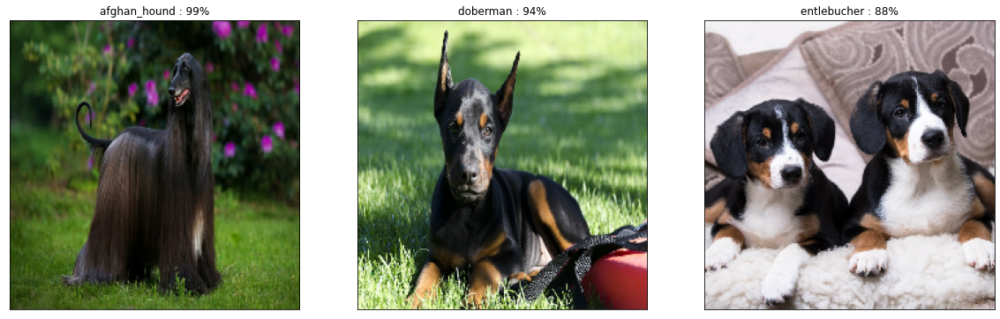

In [94]:
import math
plt.figure(figsize=(20, 10))

for i, image in enumerate(custom_dog_pics):
  plt.subplot(1, 3, i+1) # row, column, index
  plt.xticks([])
  plt.yticks([])
  plt.title(f'{custom_dog_images_preds_labels[i]} : {math.floor(custom_dog_images_preds_max_val[i]*100)}%')
  # plt.title(f'{custom_dog_images_preds_labels[i]} \n {custom_dog_images_preds_max_val[i]*100} %')
  # plt.title(f'{custom_dog_images_preds_labels[i]} : {custom_dog_images_preds_max_val[i]*100:2.0f}%')
  plt.imshow(image)
plt.show()